# AgriMarket

## 농수산물


- Data Source : [농식품 빅데이터 거래소](https://kadx.co.kr/product/detail/94534d90-595d-11eb-acdd-9560621d9652)

- Collection Method : Download

- Data Format : CSV

### 데이터 설명

- 일반농산물 도매 69품목 116품종, 소매 90품목 143품종 및 친환경농산물 38품목 44종 대상 가격 자료


## 소비자 물가지수 


- Data Source : [국가통계포털](https://kosis.kr/statHtml/statHtml.do?orgId=101&tblId=DT_1J20112&conn_path=I2)

- Collection Method : Download

- Data Format : CSV

### 데이터 설명

- 농산물 중 필수재라고 판단되는 곡물,채소 포함

- 사치재인 과실, 기타 농산물 제외

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import koreanize_matplotlib
%config InlineBackend.figure_format = 'retina'

# root_path = "../"
# data_path = f"{root_path}data"

# col_detail={
# 'prce_reg_ymd' : '가격등록일자',
# 'mrkt_esnt_no' : '시장고유번호',
# 'mrkt_code' : '시장코드',
# 'mrkt_nm' : '시장명',
# 'ct_code' : '시도코드',
# 'ctnp_nm' : '시도명',
# 'sggu_code' : '시군구코드',
# 'sggu_nm' : '시군구명',
# 'pdlt_code' : '품목코드',
# 'pdlt_nm' : '품목명',
# 'spcs_code' : '품종코드',
# 'spcs_nm' : '품종명',
# 'wsrt_exmn_se_code' : '도소매조사구분코드',
# 'exmn_se_nm' : '조사구분명',
# 'bulk_grad_code' : '산물등급코드',
# 'bulk_grad_nm' : '산물등급명',
# 'pdlt_prce' : '품목가격',
# 'mtc_smt_unit_mg' : '산지출하단위크기',
# 'mtc_smt_unit_nm' : '산지출하단위명',
# 'whsl_smt_unit_mg' : '도매출하단위크기',
# 'whsl_smt_unit_nm' : '도매출하단위명',
# 'rtsl_smt_unit_mg' : '소매출하단위크기',
# 'rtsl_smt_unit_nm' : '소매출하단위명',
# 'evfd_fmpd_smt_unit_mg' : '친환경농산물출하단위크기',
# 'evfd_fmpd_smt_unit_nm' : '친환경농산물출하단위명',
# 'dcnt_prce_yn' : '할인가격여부',
# 'etl_ldg_dt' : 'ETL적재일시'
# }

# 파일 호출, 변수명 및 불러오기 경로는 자신에게 맞게 변경해주시면 됩니다.

In [2]:
df = pd.read_csv("df_market.csv")
df = df.drop(columns=["Region"])
df

,YMD,Product,WR,Grade,Price,YM
0,20050103,쌀,도매,상품,40000.0,200501
1,20050103,쌀,도매,상품,40000.0,200501
2,20050103,쌀,도매,상품,40000.0,200501
3,20050103,쌀,도매,상품,40000.0,200501
4,20050103,쌀,도매,상품,40000.0,200501
...,...,...,...,...,...,...
14237905,20201231,청경채,07,무농약,4470.0,202012
14237906,20201231,팽이버섯,07,무농약,930.0,202012
14237907,20201231,상추,07,유기농,4940.0,202012
14237908,20201231,토마토,07,무농약,16800.0,202012


In [3]:
crop_list = [
    "호박",
    "고구마",
    "양파",
    "무",
    "배",
    "배추",
    "마늘",
    "양배추",
    "시금치",
    "콩",
    "땅콩",
    "풋고추",
    "오이",
    "깻잎",
    "생강",
    "사과",
    "포도",
    "당근",
    "복숭아",
    "미나리",
    "감자",
    "열무",
    "쌀",
]

len(crop_list)

23

In [4]:
crop_list2 = [
    "마늘",
    "깻잎",
    "감자",
    "고구마",
]

# 1. 년·월·일 에서 연·월 로 변경
# 2. Y(년), M(월) 컬럼 생성

In [5]:
df['YMD'] = df['YMD'].astype(str)

df['Y'] = df['YMD'].map(lambda x:x[:4])
df['MD'] = df['YMD'].map(lambda x:x[4:])

In [6]:
# 20년 데이터만 있는 품목 제외

df = df[~df['Product'].isin(['즉석밥', '두부', '김치', '고추장', '된장', '간장', '맛김(조미김)', '콩나물'])]

In [7]:
df.loc[df["Product"]=="피마늘", "Product"] = "마늘"

In [8]:
df = df[df["Product"].isin(crop_list)]

In [9]:
# Wholesale : 도매
df_w = df[df['WR']=='도매']

In [10]:
# Retail : 소매
df_r = df[df['WR']=='소매']

In [11]:
product_w = df_w['Product'].unique()
product_w = product_w.tolist()

In [12]:
product_r = df_r['Product'].unique()
product_r = product_r.tolist()

C:\Users\Maplexz\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


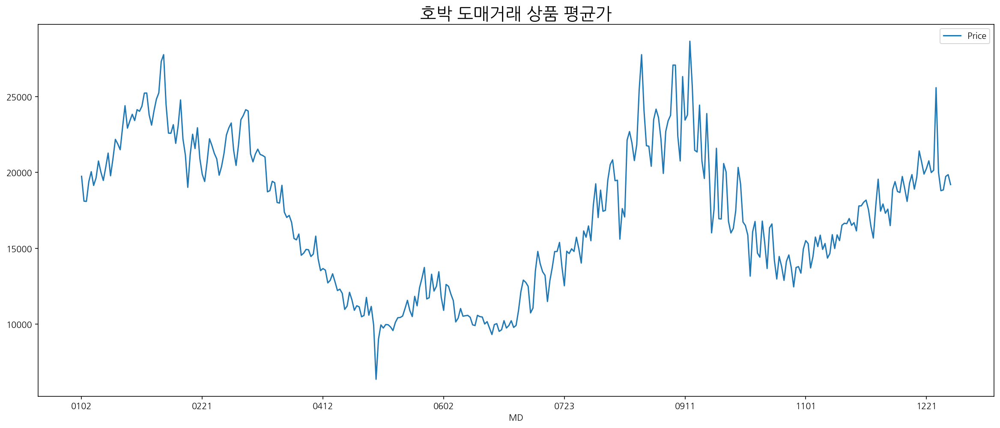

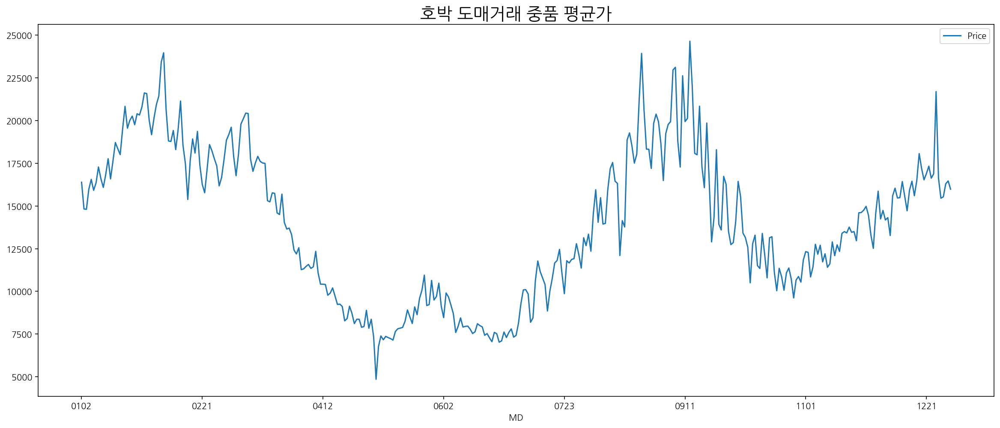

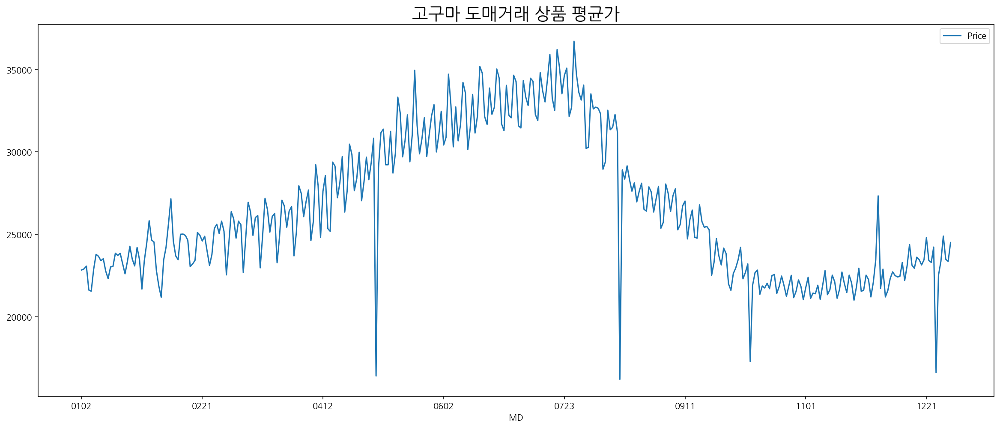

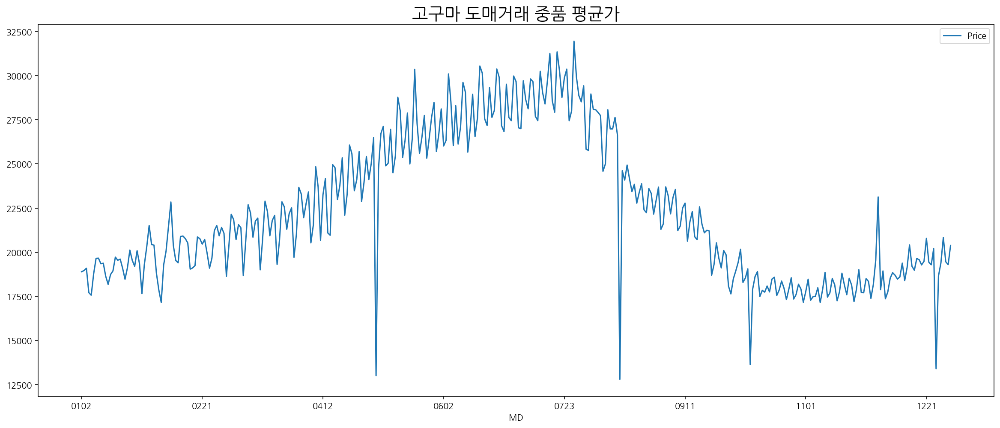

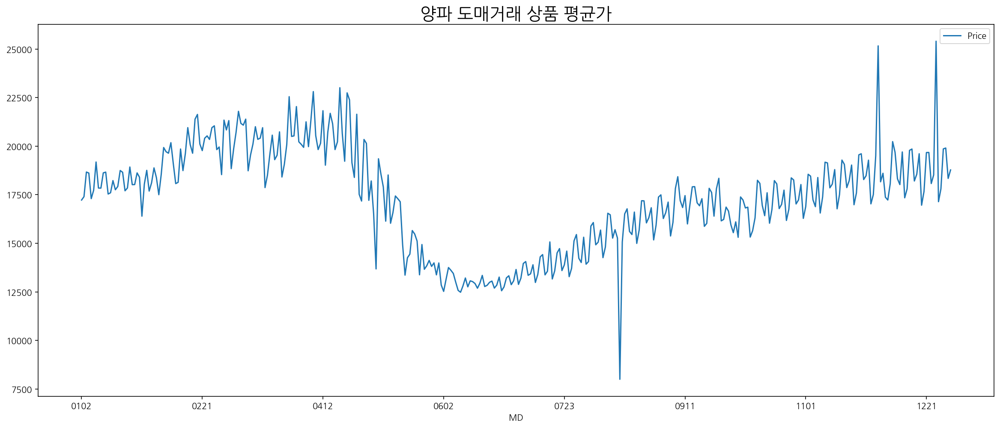

...

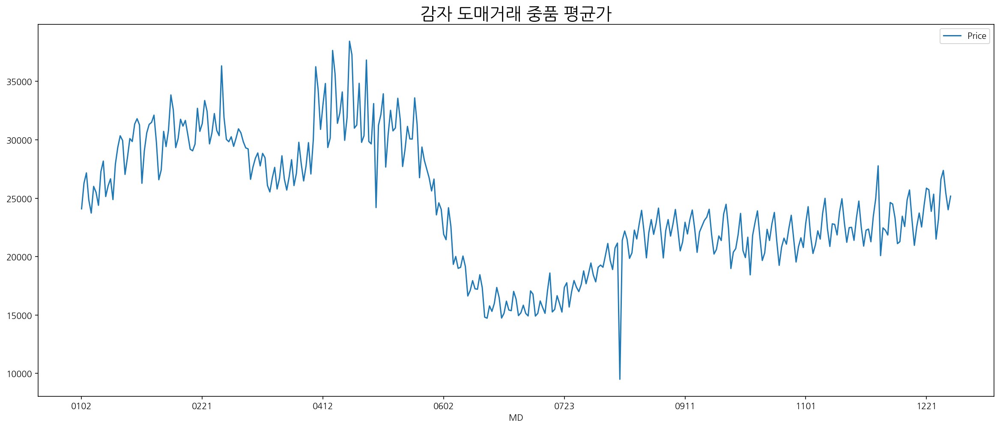

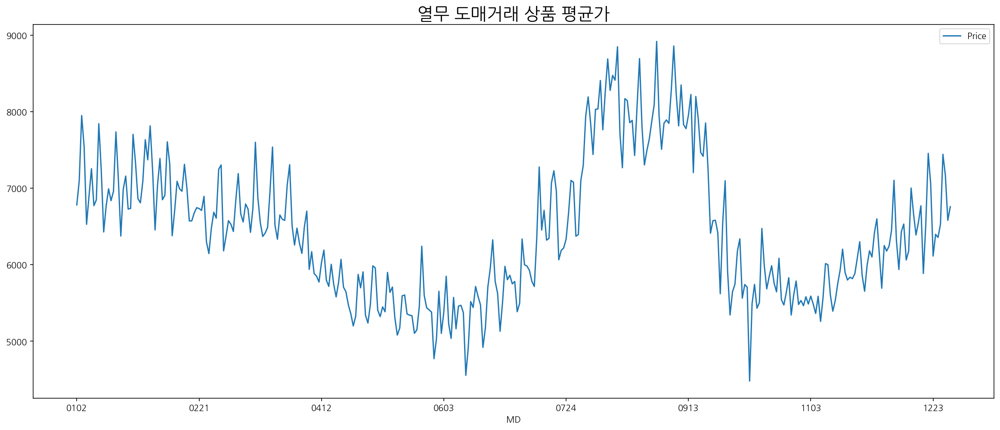

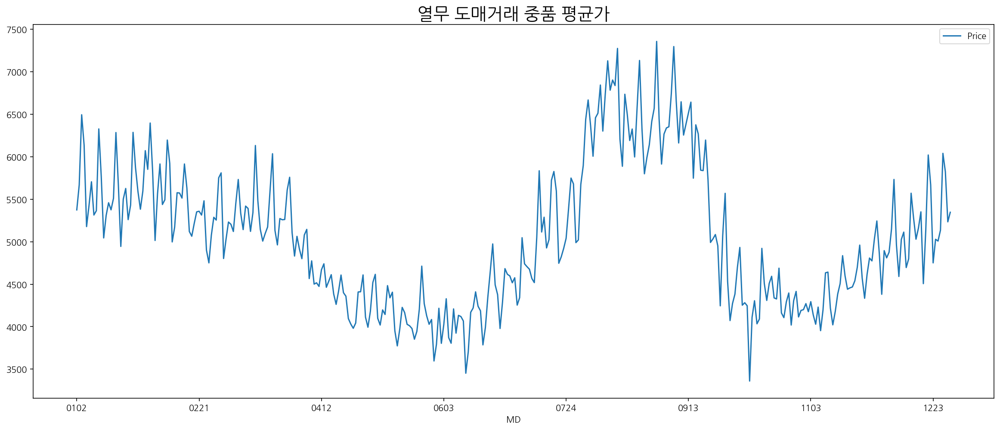

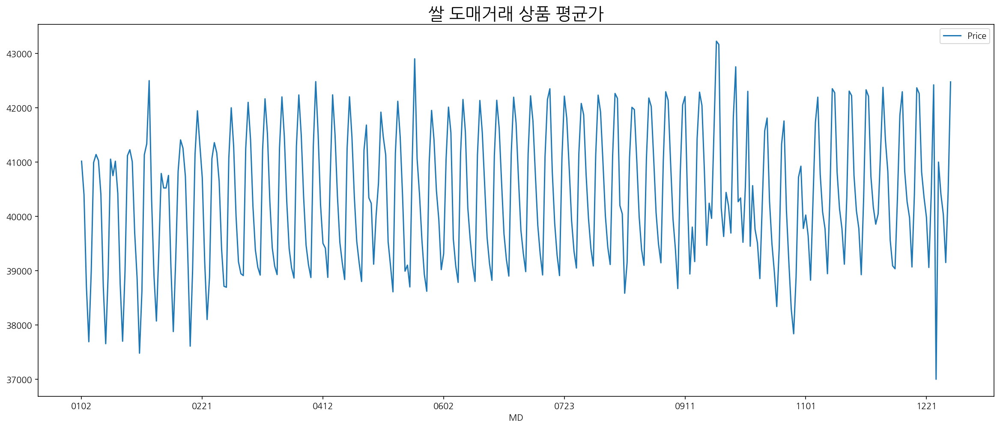

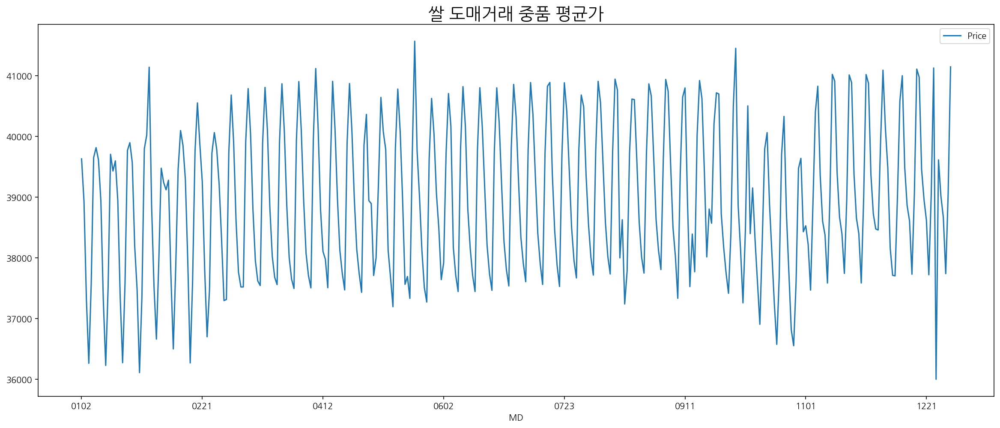

In [13]:
for i in crop_list:
    
    df_w[(df_w['Product']==i) & (df_w['Grade']=='상품')].groupby(['MD'])[['Price']].mean().plot(figsize=(20,8))
    plt.title(f'{i} 도매거래 상품 평균가', fontsize=20)
    
    df_w[(df_w['Product']==i) & (df_w['Grade']=='중품')].groupby(['MD'])[['Price']].mean().plot(figsize=(20,8))
    plt.title(f'{i} 도매거래 중품 평균가', fontsize=20)

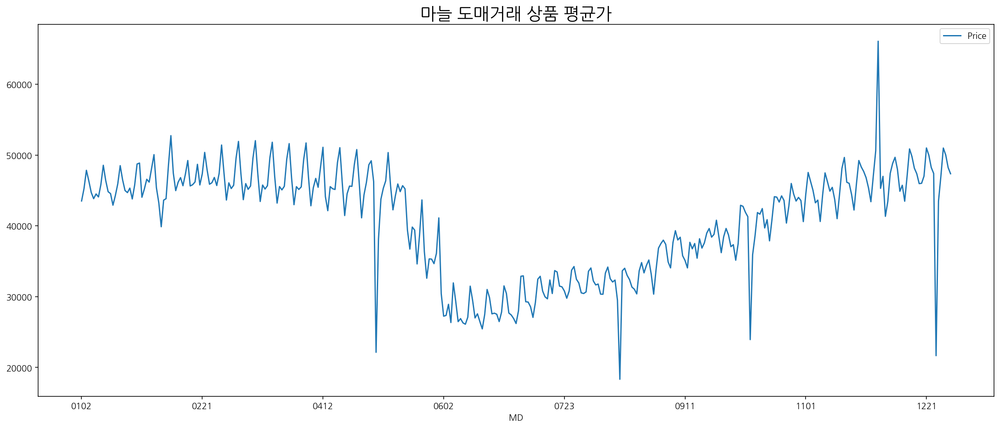

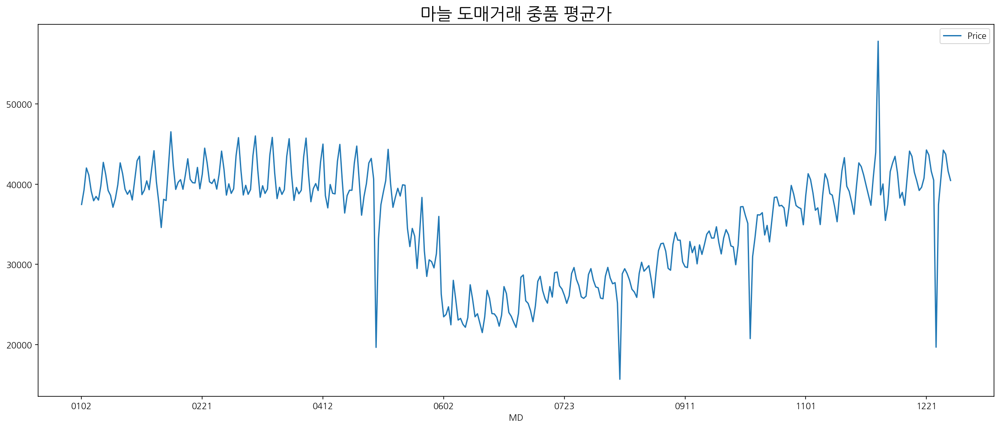

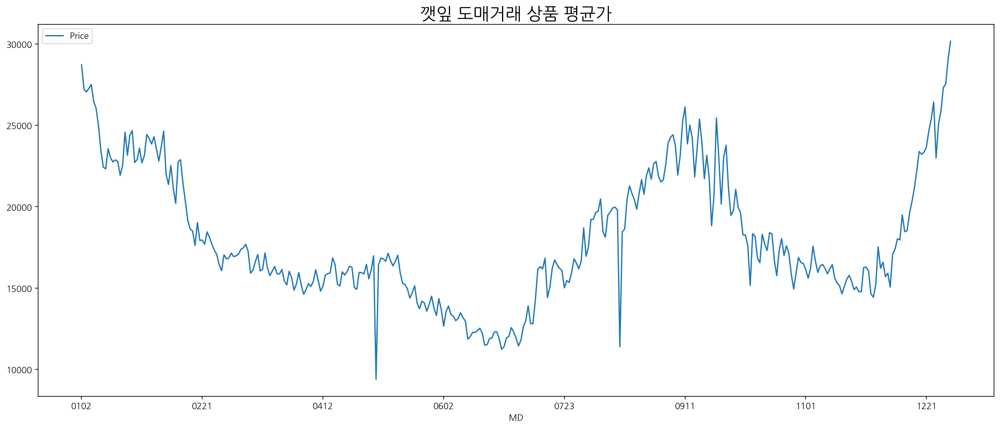

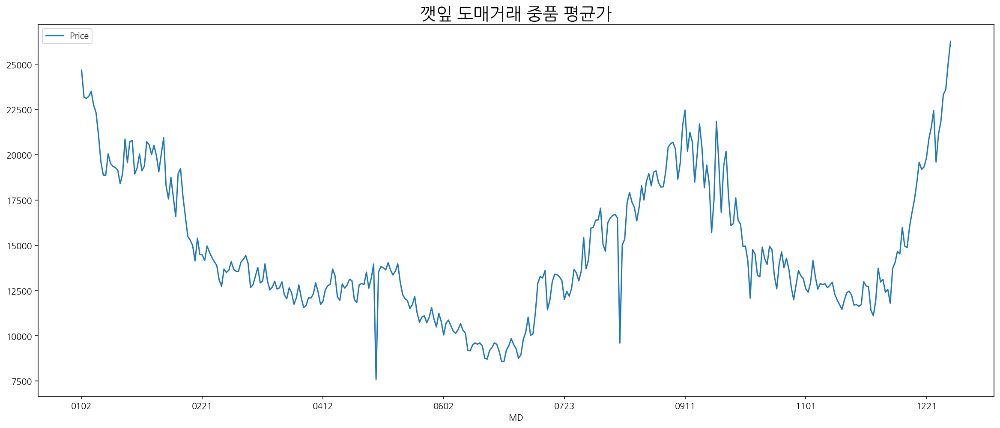

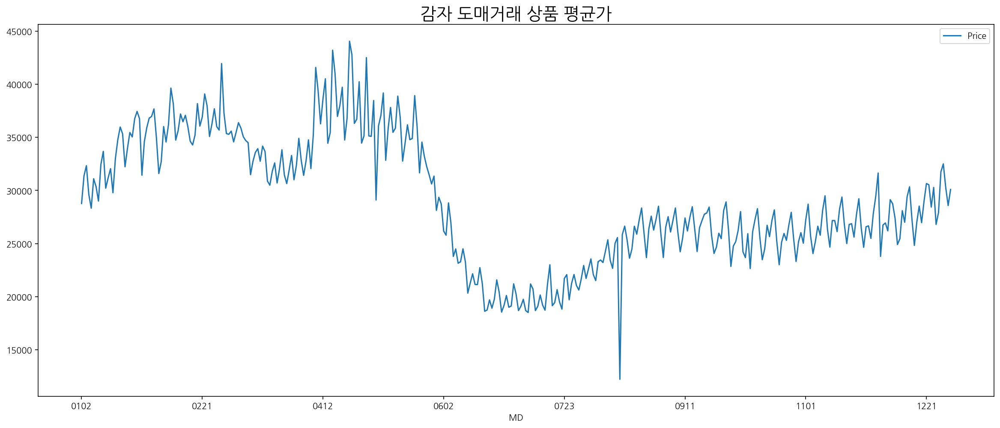

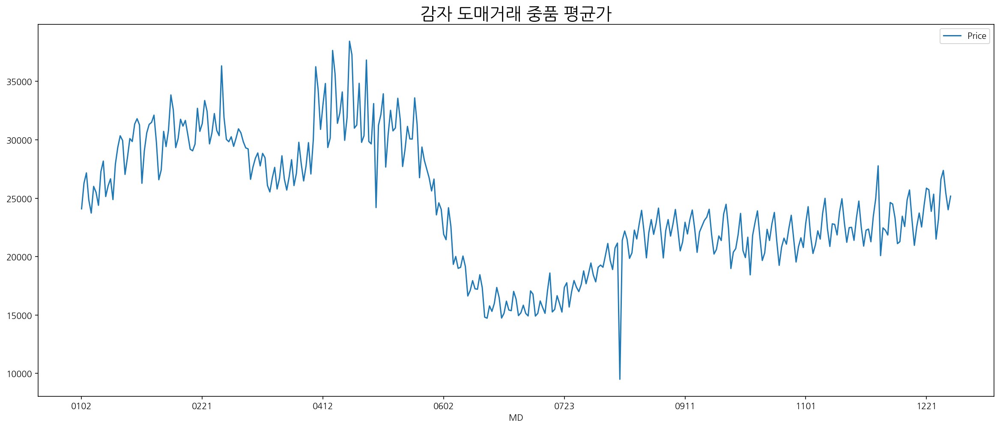

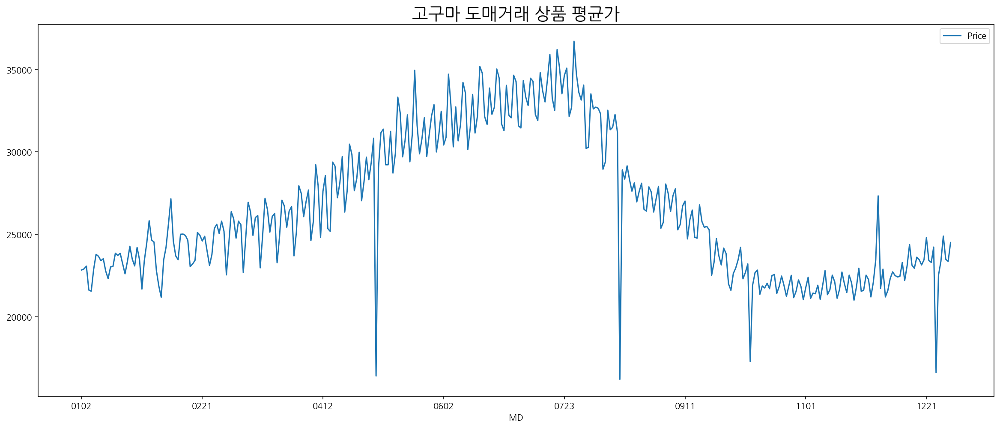

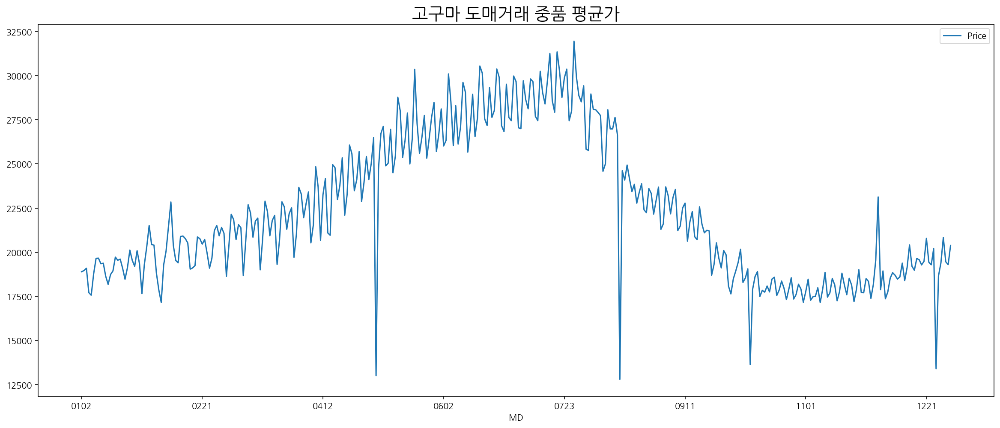

In [14]:
for i in crop_list2:
    
    df_w[(df_w['Product']==i) & (df_w['Grade']=='상품')].groupby(['MD'])[['Price']].mean().plot(figsize=(20,8))
    plt.title(f'{i} 도매거래 상품 평균가', fontsize=20)
    
    df_w[(df_w['Product']==i) & (df_w['Grade']=='중품')].groupby(['MD'])[['Price']].mean().plot(figsize=(20,8))
    plt.title(f'{i} 도매거래 중품 평균가', fontsize=20)